Batch correction module across different technologies

In [37]:
import scanpy as sc
import numpy as np
import sctm
import squidpy as sq
import pandas as pd
import seaborn as sns
import anndata as ad

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [21]:
adata = sc.read_h5ad("../../../../STAMP/Stereo_MOB/adata_processed.h5ad")

In [26]:
adata.obs['batch']

824_768_BX7_final     stereo
842_564_BX7_final     stereo
996_608_BX7_final     stereo
795_659_BX7_final     stereo
1018_644_BX7_final    stereo
                       ...  
GTTGGGAAGTTAGT         slide
GCAGCCCAGTATTA         slide
GCTTAAGTGGTGAT         slide
TTTTTTTTCTTTTT         slide
GGTTATCGACACAT         slide
Name: batch, Length: 148047, dtype: category
Categories (3, object): ['slide', 'stereo', 'visium']

In [96]:
adata_visium = adata[adata.obs.batch == "visium"]
adata_stereo = adata[adata.obs.batch == "stereo"]
adata_slide = adata[adata.obs.batch == "slide"]

/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


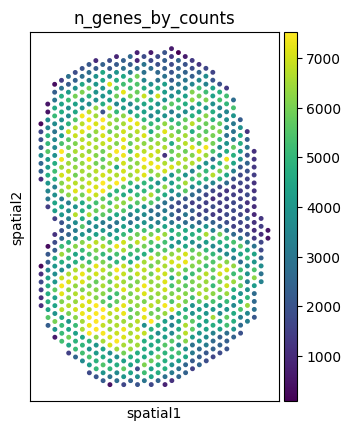

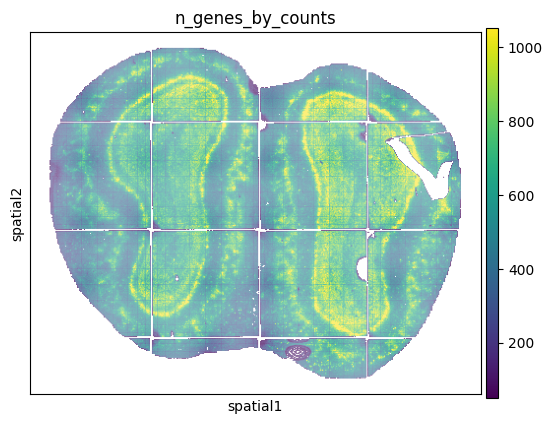

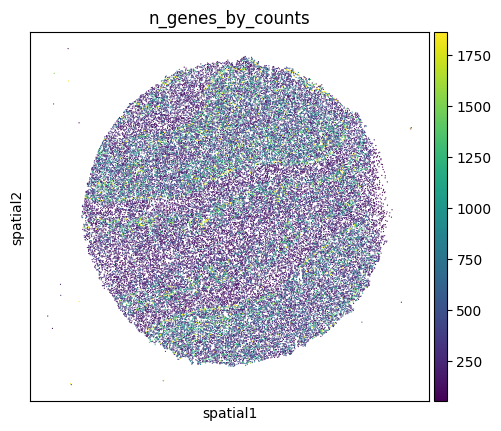

In [33]:
sctm.pl.spatial(adata_visium, size = 50, color = "n_genes_by_counts", vmax = 'p99')
sctm.pl.spatial(adata_stereo, size = 2, color = "n_genes_by_counts", vmax = 'p99')
sctm.pl.spatial(adata_slide, size = 3, color = "n_genes_by_counts", vmax = 'p99')

In [73]:
# # Use hvgs
model = sctm.stamp.STAMP(
    adata[:, adata.var.highly_variable],
    n_topics=12,
    categorical_covariate_keys=["batch"],
    layer="count",
    # gene_likelihood="nb",
)
model.train(batch_size = 4096, max_epochs = 10)
# model.save("models/Stereoseq_spatial_final12.pth")
# model.load("models/Stereoseq_spatial_final12.pth")

Computing background frequencies


  0%|          | 0/10 [00:00<?, ?it/s]/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/pyro/primitives.py:443: UserWarning: encoder.norm_topic.0.weight was not registered in the param store because requires_grad=False. You can silence this warning by calling my_module.train(False)
  warnings.warn(
/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/pyro/primitives.py:443: UserWarning: encoder.norm_topic.1.weight was not registered in the param store because requires_grad=False. You can silence this warning by calling my_module.train(False)
  warnings.warn(
/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/pyro/primitives.py:443: UserWarning: encoder.norm_topic.2.weight was not registered in the param store because requires_grad=False. You can silence this warning by calling my_module.train(False)
  warnings.warn(
Epoch Loss:1589.489: 100%|██████████| 10/10 [03:32<00:00, 21.27s/it]


In [97]:
def rotateMatrix(a):
    return np.array([[np.cos(a), -np.sin(a)], [np.sin(a), np.cos(a)]])
adata_visium.obsm['spatial'] = adata_visium.obsm['spatial'] @ rotateMatrix(4.6)
adata_slide.obsm['spatial'] = adata_slide.obsm['spatial'] @ rotateMatrix(1.2)

/tmp/ipykernel_578637/3934881131.py:3: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  adata_visium.obsm['spatial'] = adata_visium.obsm['spatial'] @ rotateMatrix(4.6)
/tmp/ipykernel_578637/3934881131.py:4: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  adata_slide.obsm['spatial'] = adata_slide.obsm['spatial'] @ rotateMatrix(1.2)


In [98]:
topic_prop = model.get_cell_by_topic()
beta = model.get_feature_by_topic()

for i in range(1, 12 + 1):
    adata_visium.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]
    adata_stereo.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]
    adata_slide.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]
    adata.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]

/tmp/ipykernel_578637/2849494166.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_stereo.obs[f"Topic{i}"] = topic_prop[[f"Topic{i}"]]


/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


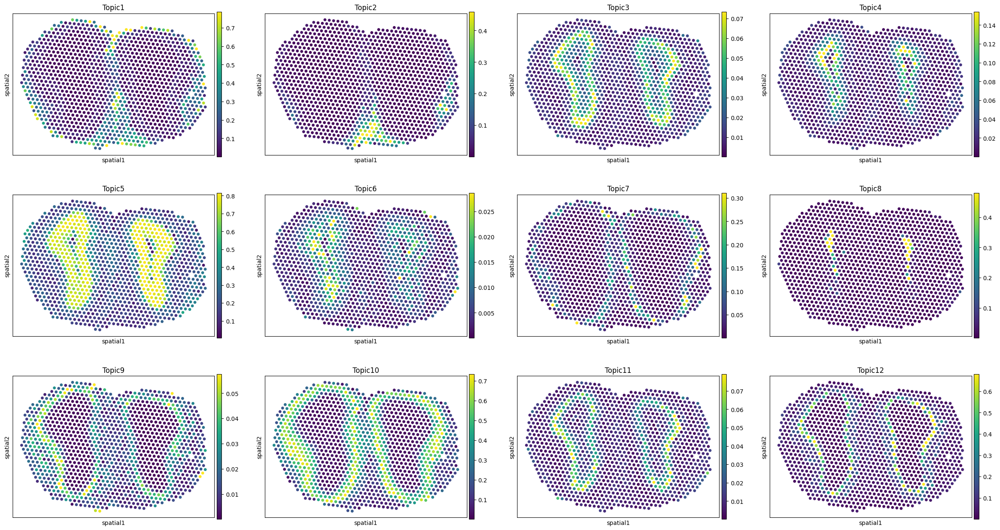

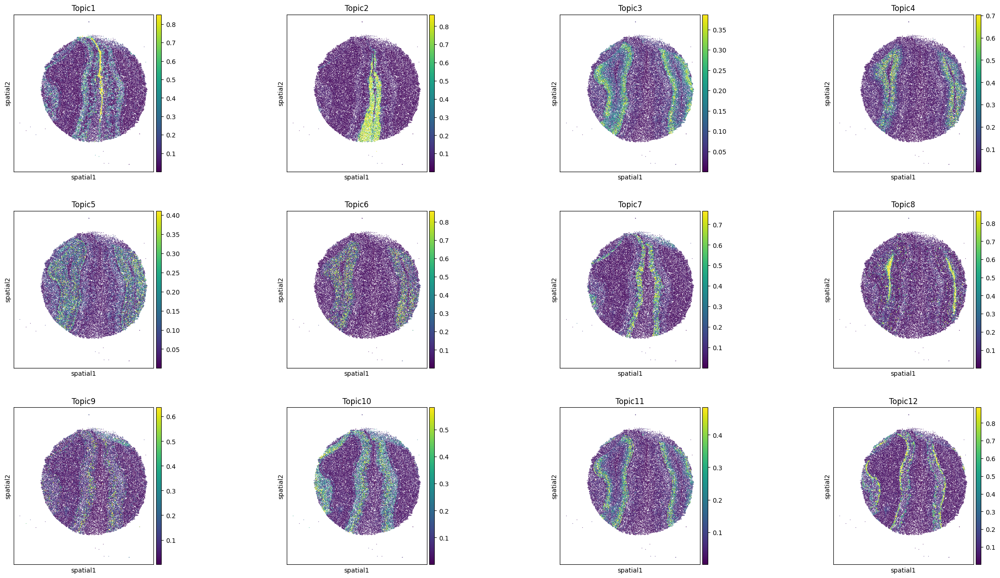

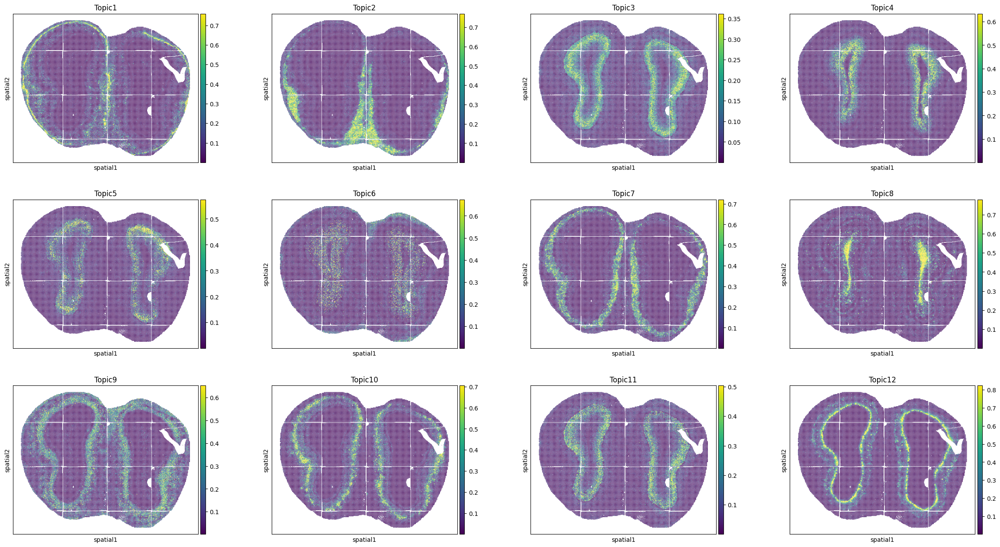

In [99]:
sctm.pl.spatial(adata_visium, color = topic_prop.columns, size = 100, vmax = 'p99')
sctm.pl.spatial(adata_slide, color = topic_prop.columns, size = 3, vmax = 'p99')
sctm.pl.spatial(adata_stereo, color = topic_prop.columns, size = 2, vmax = 'p99')